In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Наблюдения
- Радиограммы имеют разную продолжительность.
- Аномальные участки имеют похожий вид, прослеживается закономерность, шаблонность аномальных участков графика.  
Вероятно хорошим признаком будет первая производная от значения R-R итервала.  
- Можно добавить в признаки две предыдущие точки (?).  
- Максимальные и минимальные пики аномальных участков не всегда превышают макс/мин значения на всём R-R графике.
- Кажется разметка делалась в окрестности аномальной точки. Брали в среднем 2-5 точек до и после аномальной.

In [2]:
data = pd.read_csv('../input/cardiospikecompetition/train.csv')
display(data.head())
data.info()

,id,time,x,y
0,1,0,800,0
1,1,780,780,0
2,1,1572,792,0
3,1,2392,820,0
4,1,3196,804,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60487 entries, 0 to 60486
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   id      60487 non-null  int64
 1   time    60487 non-null  int64
 2   x       60487 non-null  int64
 3   y       60487 non-null  int64
dtypes: int64(4)
memory usage: 1.8 MB


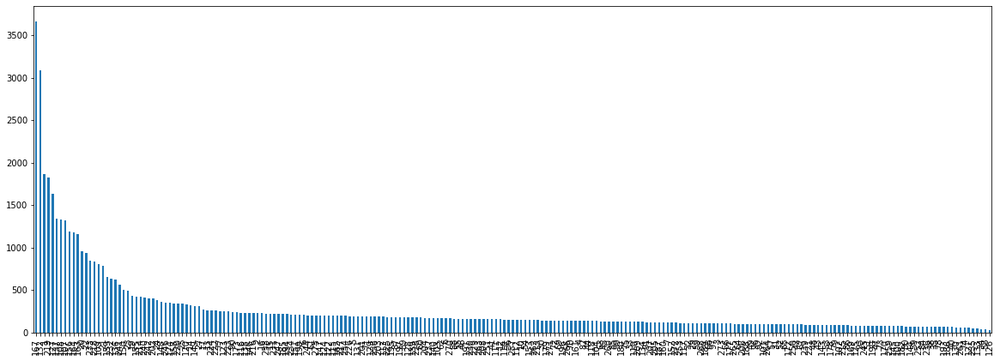

In [3]:
data.id.value_counts().plot.bar(figsize=(20,7));

In [4]:
# top 10
data.id.value_counts()[:10]

167    3661
132    3085
1      1870
219    1821
127    1632
137    1336
108    1327
107    1321
156    1187
164    1176
Name: id, dtype: int64

In [5]:
# last 10
data.id.value_counts()[-10:]

40     65
130    58
261    57
74     56
121    56
235    51
133    47
34     41
58     41
126    32
Name: id, dtype: int64

In [6]:
print('mean', data.time.mean(), 'ms')
print('min', data.time.min(), 'ms')
print('max', data.time.max(), 'ms')

mean 250314.01502802255 ms
min 0 ms
max 1868576 ms


In [7]:
print('max time', (data.time.max()/1000)/60, 'minutes')
print('mean time', (data.time.mean()/1000)/60, 'minutes')

max time 31.142933333333335 minutes
mean time 4.171900250467043 minutes


In [8]:
ids = data.id.unique()
ids

array([  1,   2,   3,   4,   5,   6,   7,  10,  12,  13,  14,  15,  16,
        17,  19,  20,  21,  22,  23,  24,  25,  27,  29,  30,  31,  32,
        33,  34,  35,  36,  38,  39,  40,  41,  42,  43,  44,  45,  46,
        47,  48,  49,  51,  52,  53,  54,  55,  57,  58,  59,  60,  61,
        62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,
        75,  76,  77,  78,  79,  80,  82,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  96,  97,  99, 100, 101, 102, 103, 104, 107,
       108, 109, 110, 111, 112, 113, 115, 116, 117, 118, 119, 120, 121,
       122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134,
       136, 137, 138, 139, 140, 143, 144, 145, 146, 147, 148, 149, 150,
       151, 152, 153, 155, 156, 158, 159, 160, 161, 162, 163, 164, 167,
       169, 170, 172, 173, 174, 177, 178, 179, 180, 182, 185, 186, 187,
       188, 189, 190, 191, 193, 194, 195, 196, 197, 199, 201, 202, 203,
       204, 205, 206, 207, 208, 209, 213, 214, 215, 216, 217, 21

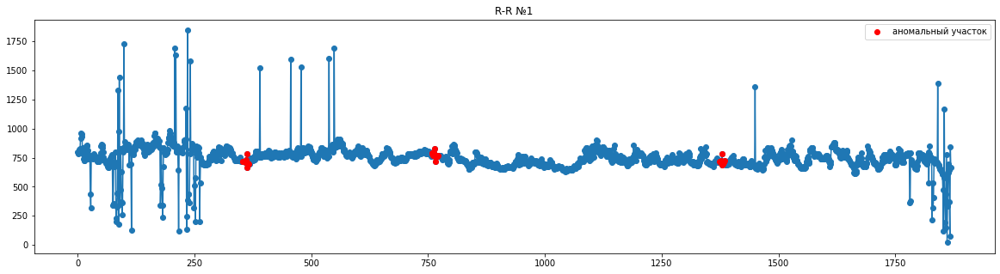

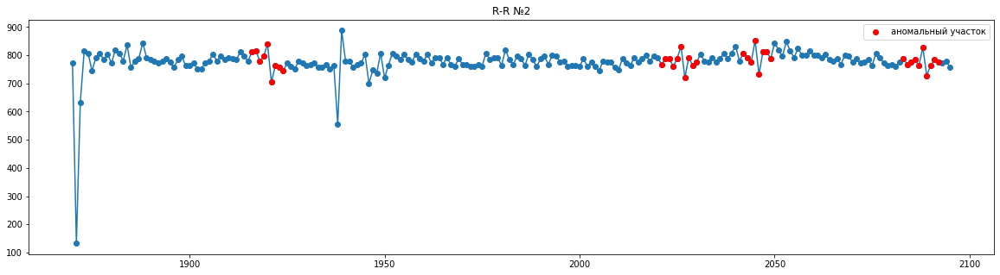

In [9]:
for rr_id in ids[:2]:
    fig = plt.figure(figsize=(20,5))
    plt.title(f'R-R №{rr_id}')
    plt.plot(data[data.id == rr_id].x, '-o', zorder=1)
    mask = (data.id == rr_id)&(data.y == 1)
    plt.scatter(data[mask].index, data[mask].x, label='аномальный участок', color='red',zorder=2)
    plt.legend()
    plt.show()

In [10]:
mask = (data.id == 1)&(data.y == 1)
data[mask]

,id,time,x,y
353,1,272904,716,1
354,1,273620,716,1
355,1,274340,720,1
356,1,275060,720,1
357,1,275776,716,1
358,1,276484,708,1
359,1,277200,716,1
360,1,277924,724,1
361,1,278656,732,1
362,1,279440,784,1


<AxesSubplot:>

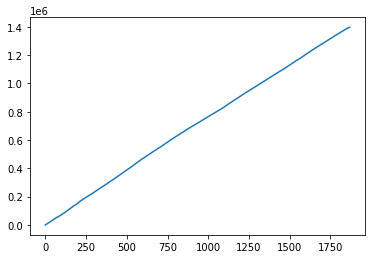

In [11]:
data[data.id == 1].time.plot()

время линейно возрастает, т.е. time - это таймер, запущенный в начале записи радиограммы у конкретного пациента и остановленный в конце замера

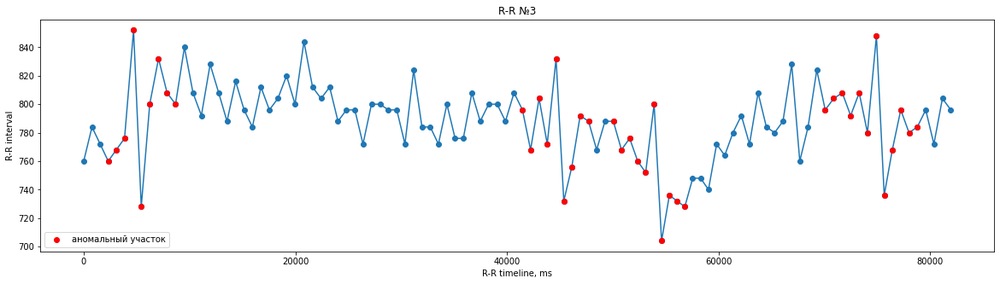

In [12]:
df = data.set_index('time').copy()
for rr_id in [ids[2]]:
    fig = plt.figure(figsize=(20,5))
    plt.title(f'R-R №{rr_id}')
    plt.plot(df[df.id == rr_id].x, '-o', zorder=1)
    mask = (df.id == rr_id)&(df.y == 1)
    plt.scatter(df[mask].index, df[mask].x, label='аномальный участок', color='red',zorder=2)
    plt.legend()
    plt.xlabel('R-R timeline, ms')
    plt.ylabel('R-R interval')
    plt.show()

# test
df_anomaly['time-diff'] = df_anomaly.time.diff()
df_anomaly['split'] = 0
df_anomaly.loc[(df_anomaly['time-diff'] > 1000), 'split'] = 1
split_indexes = df_anomaly[df_anomaly['time-diff'] > 1000].index
display(split_indexes)
display(df_anomaly)

# test
l = list(split_indexes)
l.append(0)
l.sort()
l

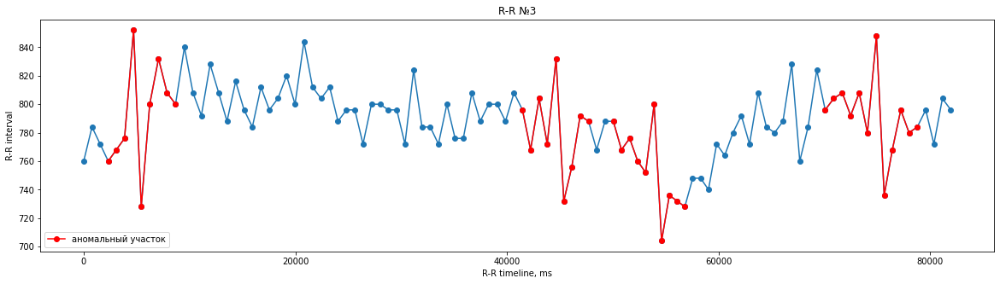

In [13]:
df = data.set_index('time').copy()
for rr_id in [ids[2]]:
    fig = plt.figure(figsize=(20,5))
    plt.title(f'R-R №{rr_id}')
    plt.plot(df[df.id == rr_id].x, '-o', zorder=1)
    df_anomaly = df[(df.id == rr_id)&(df.y == 1)].reset_index()
    df_anomaly['time-diff'] = df_anomaly.time.diff()
    split_indexes = df_anomaly[df_anomaly['time-diff'] > 1000].index
    split_indexes = list(split_indexes)
    split_indexes.append(0)
    split_indexes.sort()
    len_spl = len(split_indexes)
    for i in range(len_spl):
        if i == len_spl-1:
            mask = (df_anomaly.index >= split_indexes[i])
            plt.plot(df_anomaly[mask].time, df_anomaly[mask].x, '-o',
                 label='аномальный участок', color='red', zorder=2)
        else:
            mask = (df_anomaly.index >= split_indexes[i])&(df_anomaly.index < split_indexes[i+1])
            plt.plot(df_anomaly[mask].time, df_anomaly[mask].x, '-o',
                     color='red', zorder=2)
    plt.legend()
    plt.xlabel('R-R timeline, ms')
    plt.ylabel('R-R interval')
    plt.show()

# Графики радиограмм с выделенными аномалиями

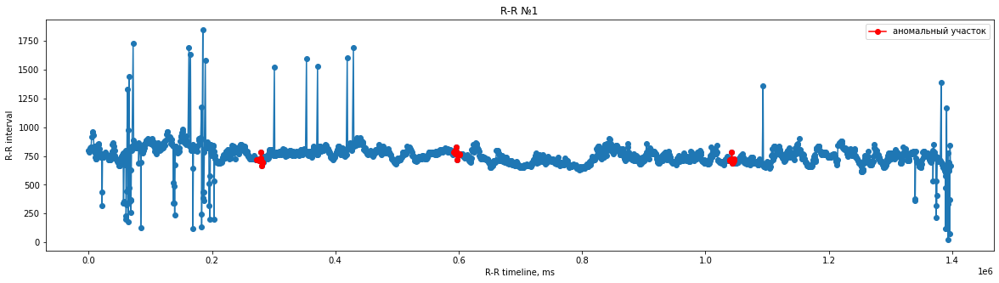

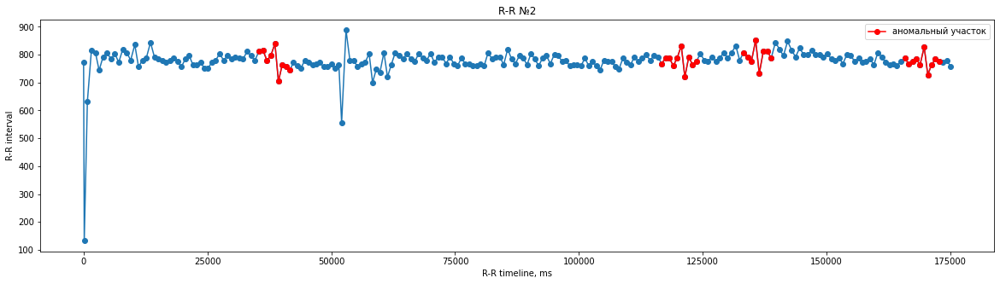

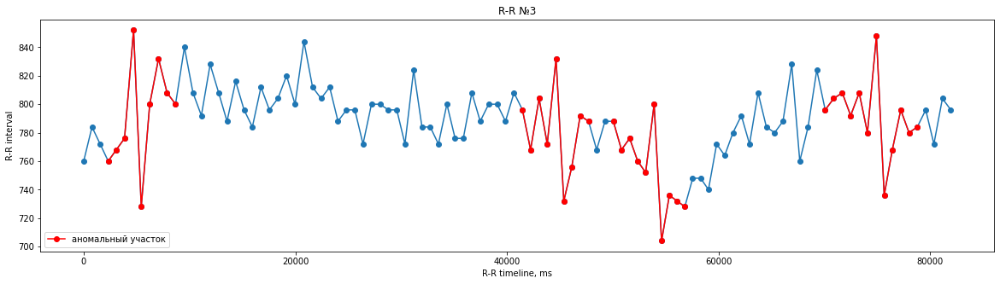

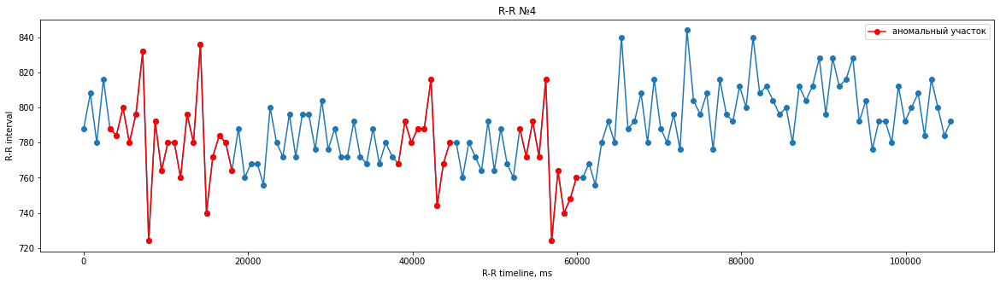

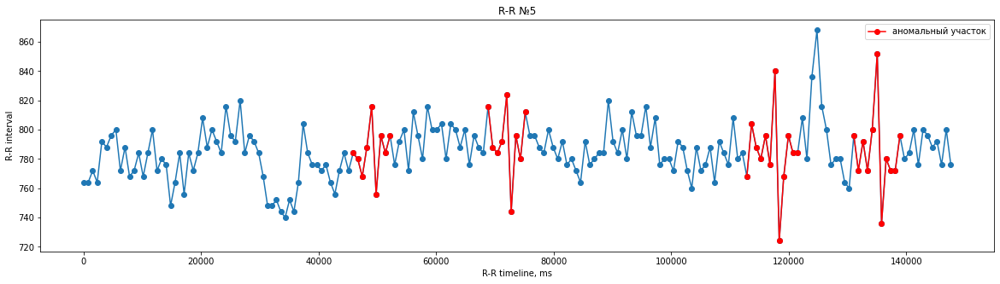

...

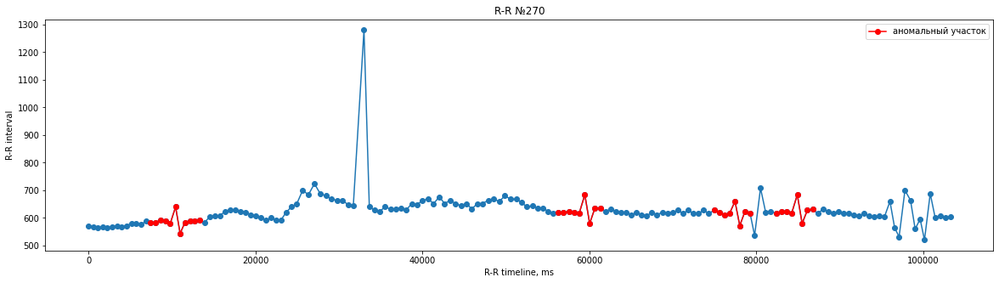

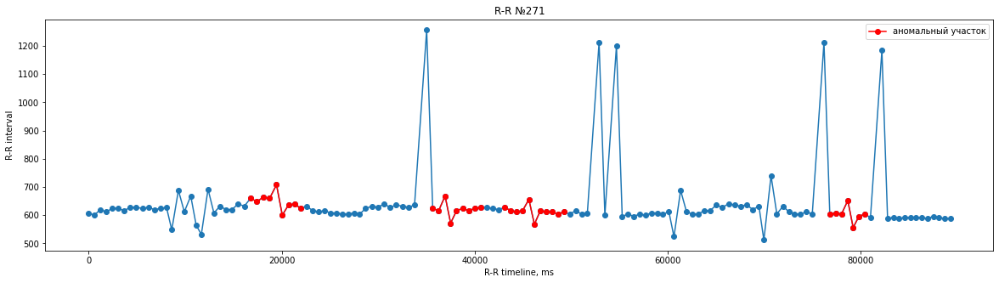

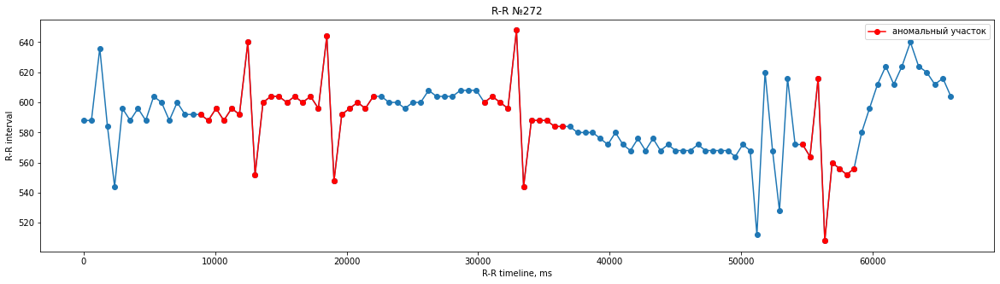

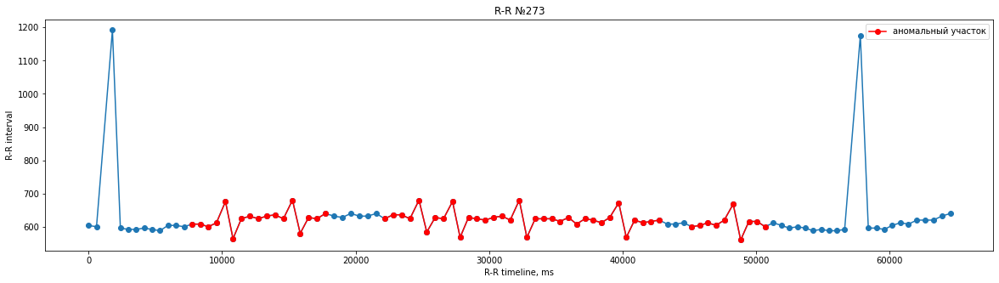

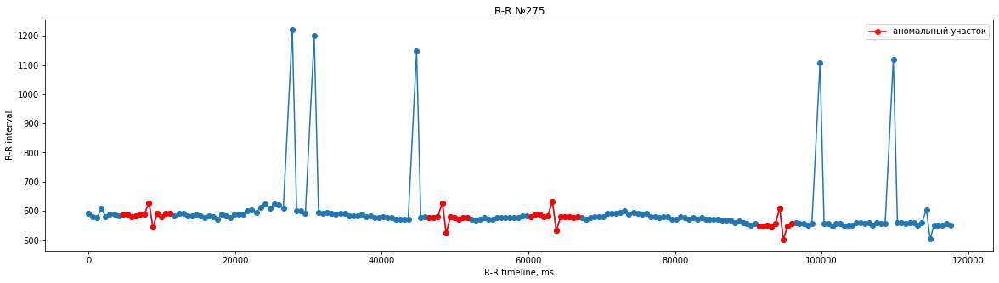

In [14]:
df = data.set_index('time').copy()
for rr_id in ids:
    fig = plt.figure(figsize=(20,5))
    plt.title(f'R-R №{rr_id}')
    plt.plot(df[df.id == rr_id].x, '-o', zorder=1)
    df_anomaly = df[(df.id == rr_id)&(df.y == 1)].reset_index()
    df_anomaly['time-diff'] = df_anomaly.time.diff()
    split_indexes = df_anomaly[df_anomaly['time-diff'] > 1000].index
    split_indexes = list(split_indexes)
    split_indexes.append(0)
    split_indexes.sort()
    len_spl = len(split_indexes)
    for i in range(len_spl):
        if i == len_spl-1:
            mask = (df_anomaly.index >= split_indexes[i])
            plt.plot(df_anomaly[mask].time, df_anomaly[mask].x, '-o',
                 label='аномальный участок', color='red', zorder=2)
        else:
            mask = (df_anomaly.index >= split_indexes[i])&(df_anomaly.index < split_indexes[i+1])
            plt.plot(df_anomaly[mask].time, df_anomaly[mask].x, '-o',
                     color='red', zorder=2)
    plt.legend()
    plt.xlabel('R-R timeline, ms')
    plt.ylabel('R-R interval')
    plt.show()

In [15]:
def plot_anomaly(df, rr_id):
    df_anomaly = df[(df.id == rr_id)&(df.y == 1)].reset_index()
    df_anomaly['time-diff'] = df_anomaly.time.diff()
    split_indexes = df_anomaly[df_anomaly['time-diff'] > 1000].index
    split_indexes = list(split_indexes)
    split_indexes.append(0)
    split_indexes.sort()
    len_spl = len(split_indexes)
    for i in range(len_spl):
        if i == len_spl-1:
            mask = (df_anomaly.index >= split_indexes[i])
            plt.plot(df_anomaly[mask].time, df_anomaly[mask].x, '-o',
                 label='аномальный участок', color='red', zorder=2)
        else:
            mask = (df_anomaly.index >= split_indexes[i])&(df_anomaly.index < split_indexes[i+1])
            plt.plot(df_anomaly[mask].time, df_anomaly[mask].x, '-o',
                     color='red', zorder=2)

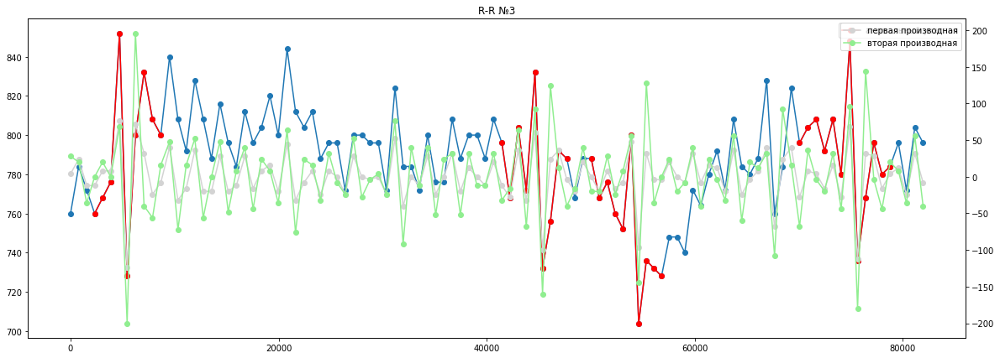

In [16]:
df['x_diff'] = df.x.diff()
df['x_2diff'] = df.x_diff.diff()

fig, ax = plt.subplots(figsize=(20,7))
mask = (df.id == ids[2])
plt.plot(df[mask].x, '-o')
plot_anomaly(df, ids[2])
ax2 = ax.twinx()
ax2.plot(df[mask].x_diff, '-o', label='первая производная', color='lightgray')
ax2.plot(df[mask].x_2diff, '-o', label='вторая производная', color='lightgreen')

plt.title(f'R-R №{ids[2]}')
ax.legend()
ax2.legend()
plt.show()

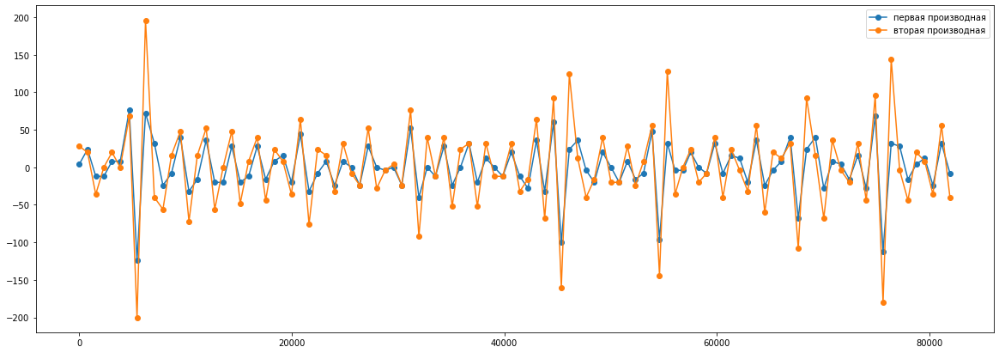

In [17]:
fig = plt.figure(figsize=(20,7))
plt.plot(df[mask].x_diff, '-o', label='первая производная')
plt.plot(df[mask].x_2diff, '-o', label='вторая производная')
# plot_anomaly(df, ids[2])

plt.legend()
plt.show()

# Расчёт статистик

**SD** — стандартное отклонение интервалов,  
**RMSSD** — «среднеквадратичное значение последовательных различий», квадратный корень из среднего значения квадратов последовательных различий между соседними интервалами,  
**SDSD** — «стандартное отклонение последовательных различий», стандартное отклонение последовательных различий между соседними интервалами